# Notebook for evaluating different merging methods

In [1]:
BASE_DIR = "/home/yyamamo2/lupus_project/Xenium_skin_COSIE/cosie-main"

In [2]:
from pathlib import Path
SAVE_DIR = Path('./hinge_checkpoints')
SAVE_DIR.mkdir(exist_ok=True)

In [3]:
import numpy as np
import pickle

import sys
sys.path.append('/home/yyamamo2/lupus_project/Xenium_skin_COSIE/cosie-main')

from COSIE.data_preprocessing import load_data
from COSIE.utils import setup_seed
from COSIE.configure import get_default_config
from COSIE.COSIE_framework import COSIE_model
from COSIE.downstream_analysis import *


import matplotlib.pyplot as plt
from COSIE.downstream_analysis import plot_histology_clusters  # reuse as-is


import pandas as pd
import scanpy as sc
import seaborn as sns
from scipy.stats import pearsonr, spearmanr
from scipy.sparse import issparse
from sklearn.preprocessing import MinMaxScaler
from anndata import AnnData
from scipy.stats import rankdata
from matplotlib import patches
 


from scipy.spatial import cKDTree

config = get_default_config()
setup_seed(config['training']['seed'])

# step 0: Load prediction, UNI embeddings

In [3]:
COSIE_OUTPUT_480PANEL_DIR = f"{BASE_DIR}/cosie_output_480panelonly"

COSIE_OUTPUT_5KPANEL_DIR = f"{BASE_DIR}/cosie_output_5kpanelonly"

In [5]:

def assign_he_features_to_cells(adata_he_superpixel, xenium_spatial):
    """
    For each Xenium cell location, find nearest HE superpixel and grab its feature vector.
    Returns a new AnnData aligned 1:1 with the Xenium cells.
    """
    superpixel_coords = adata_he_superpixel.obsm['spatial']
    superpixel_features = adata_he_superpixel.X
    if not isinstance(superpixel_features, np.ndarray):
        superpixel_features = superpixel_features.toarray()

    tree = cKDTree(superpixel_coords)
    distances, nearest_idx = tree.query(xenium_spatial, k=1)

    matched_features = superpixel_features[nearest_idx]

    adata_he_cell = ad.AnnData(X=matched_features.astype(np.float32))
    adata_he_cell.obsm['spatial'] = xenium_spatial.copy()

    # optional: keep track of match quality
    adata_he_cell.obs['nearest_superpixel_dist'] = distances

    return adata_he_cell

In [7]:

pairs = [('s1','s7'), ('s2','s8'), ('s3','s9'),
         ('s4','s10'), ('s5','s11'), ('s6','s12')]


In [8]:
with open(f"{BASE_DIR}/cosie_prediction/480and5kseparate_panels/predicted_rna.pkl", "rb") as f:
    predicted_rna=pickle.load(f)

predicted_rna

{'s1': AnnData object with n_obs × n_vars = 6989 × 5101
     obs: 'nearest_superpixel_dist'
     var: 'gene_ids', 'feature_types', 'genome'
     obsm: 'spatial',
 's2': AnnData object with n_obs × n_vars = 8978 × 5101
     obs: 'nearest_superpixel_dist'
     var: 'gene_ids', 'feature_types', 'genome'
     obsm: 'spatial',
 's3': AnnData object with n_obs × n_vars = 449221 × 5101
     obs: 'nearest_superpixel_dist'
     var: 'gene_ids', 'feature_types', 'genome'
     obsm: 'spatial',
 's4': AnnData object with n_obs × n_vars = 7442 × 5101
     obs: 'nearest_superpixel_dist'
     var: 'gene_ids', 'feature_types', 'genome'
     obsm: 'spatial',
 's5': AnnData object with n_obs × n_vars = 16540 × 5101
     obs: 'nearest_superpixel_dist'
     var: 'gene_ids', 'feature_types', 'genome'
     obsm: 'spatial',
 's6': AnnData object with n_obs × n_vars = 24862 × 5101
     obs: 'nearest_superpixel_dist'
     var: 'gene_ids', 'feature_types', 'genome'
     obsm: 'spatial',
 's7': AnnData object wi

### subset the prediction to the interesecting genes

### UNI feature

In [9]:
CATCH_result_base_dir = Path("/home/yyamamo2/lupus_project/Xenium_skin_COSIE/CATCH-main/result_single")
transformation_matrix_base_dir = Path("/home/yyamamo2/lupus_project/Xenium_skin_COSIE/cosie-main/7_31_2026_skin_xenium_transformation")

panel_480_xenium_to_unifeature_dict = {

"s1": "64841_Region_002",
"s2":"64841_Region_003",
"s3":"64841_Region_001",
"s4":"104483_Region_003",
"s5":"104483_Region_002",
"s6":"104483_Region_001"


    
}


panel_480_xenium_to_transformation_dict = {

"s1": "480_15236-1-16A",
"s2":"480_15281-1-16A",
"s3":"480_HS44",
"s4":"480_15037-1-16A",
"s5":"480_15077-1-16A",
"s6":"480_HV2"



    
}

panel_5k_xenium_to_unifeature_dict = {

"s7": "64839_Region_002",
"s8":"64839_Region_003",
"s9":"64839_Region_001",
"s10":"81614_Region_001",
"s11":"81614_Region_002",
"s12":"81614_Region_003"


    
}
panel_5k_xenium_to_transformation_dict = {

"s7": "5k_15236-1-16A",
"s8":"5k_15281-1-16B",
"s9":"5k_HS44",
"s10":"5k_15037-1-16A",
"s11":"5k_15077-1-16A",
"s12":"5k_HV2"



    
}



### Loading 480

In [10]:
def plot_coordinate_panels(xenium_xy, uni_xy, assigned_uni_xy, sample_name, s=3):
    """
    xenium_xy  : (N, 2) array, Xenium cell centroids in H&E space (the 480 panel cells)
    uni_xy     : (M, 2) array, UNI superpixel centroids (already scaled)
    assigned_uni_xy : (N, 2) array, coordinates of assigned_uni_xy
    """
    fig, axes = plt.subplots(2, 2, figsize=(14, 14), sharex=True, sharey=True)

    # 1. Xenium 480 coordinates
    axes[0, 0].scatter(xenium_xy[:, 0], xenium_xy[:, 1], s=s, c="red", alpha=0.4)
    axes[0, 0].set_title(f"480 Xenium cell coordinates (n={len(xenium_xy)})")

    # 2. UNI coordinates
    axes[0, 1].scatter(uni_xy[:, 0], uni_xy[:, 1], s=s, c="blue", alpha=0.4)
    axes[0, 1].set_title(f"UNI superpixel coordinates (n={len(uni_xy)})")

    # 3. adata_he_cell coordinates
    axes[1, 0].scatter(assigned_uni_xy[:, 0], assigned_uni_xy[:, 1], s=s, c="green", alpha=0.4)
    axes[1, 0].set_title(f"adata_he_cell coordinates (n={len(assigned_uni_xy)})")

    # 4. Overlap: adata_he_cell + 480 Xenium
    axes[1, 1].scatter(xenium_xy[:, 0], xenium_xy[:, 1], s=s, c="red", alpha=0.8,
                       label="Xenium")
    axes[1, 1].scatter(assigned_uni_xy[:, 0], assigned_uni_xy[:, 1], s=s, c="green", alpha=0.3,
                       label="adata_he_cell")
    axes[1, 1].set_title("Overlap: adata_he_cell + 480 Xenium")
    axes[1, 1].legend(markerscale=8, loc="upper right")

    for ax in axes.ravel():
        ax.set_aspect("equal")
        ax.invert_yaxis()   # image coordinates: origin at top-left; remove if not wanted
        ax.axis("off")

    fig.suptitle(f"Sample: {sample_name}", fontsize=16)
    plt.tight_layout()

    plt.show()




###############################################################################

Sample name: s1


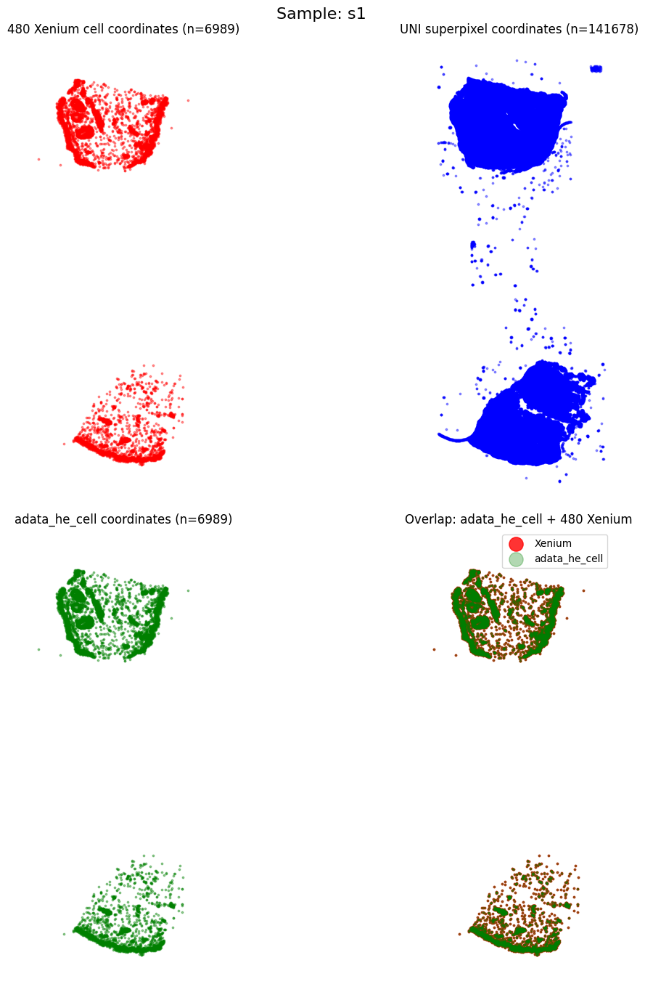


###############################################################################

Sample name: s2


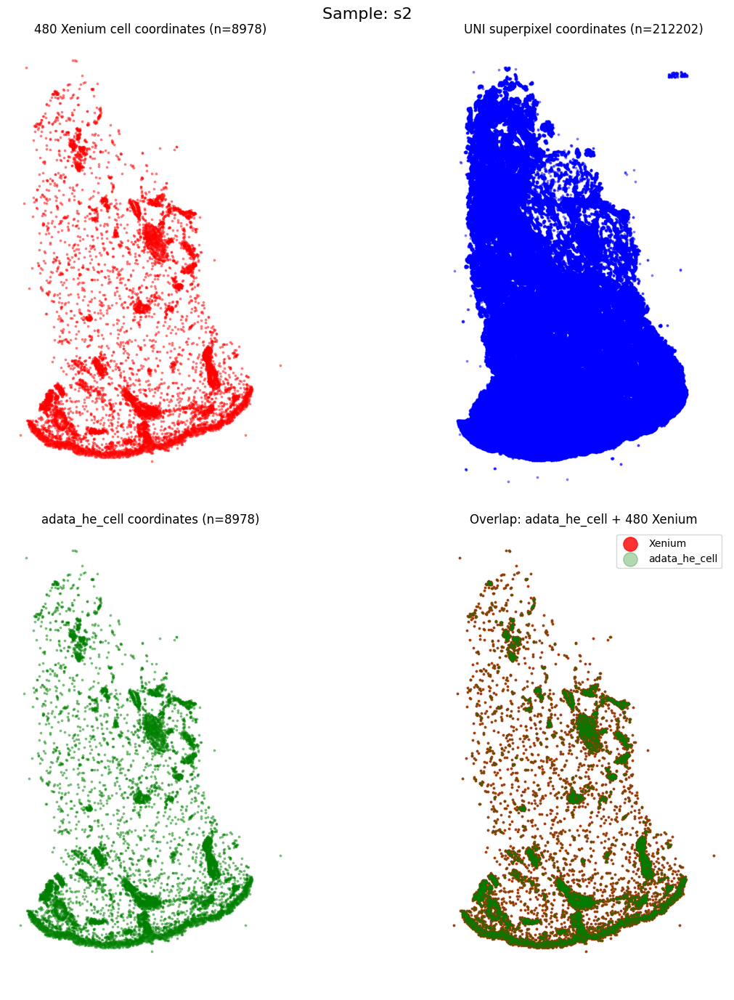


###############################################################################

Sample name: s3


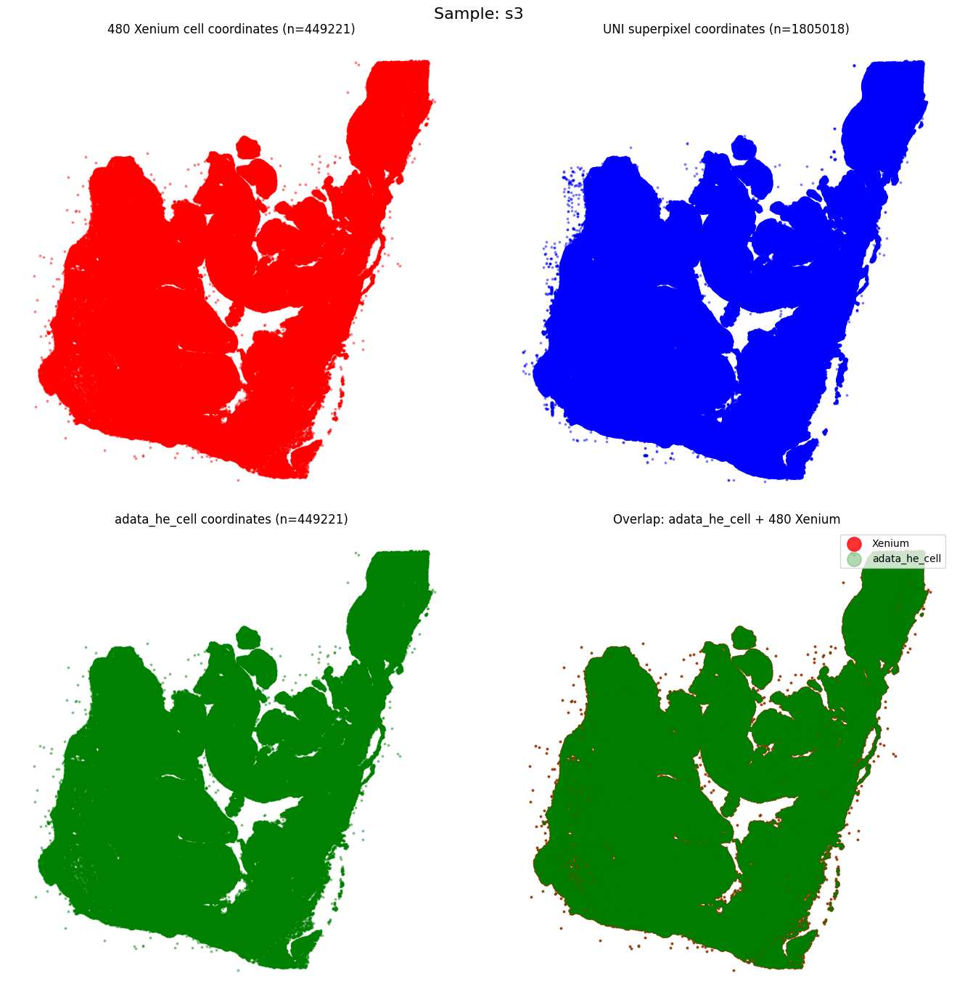


###############################################################################

Sample name: s4


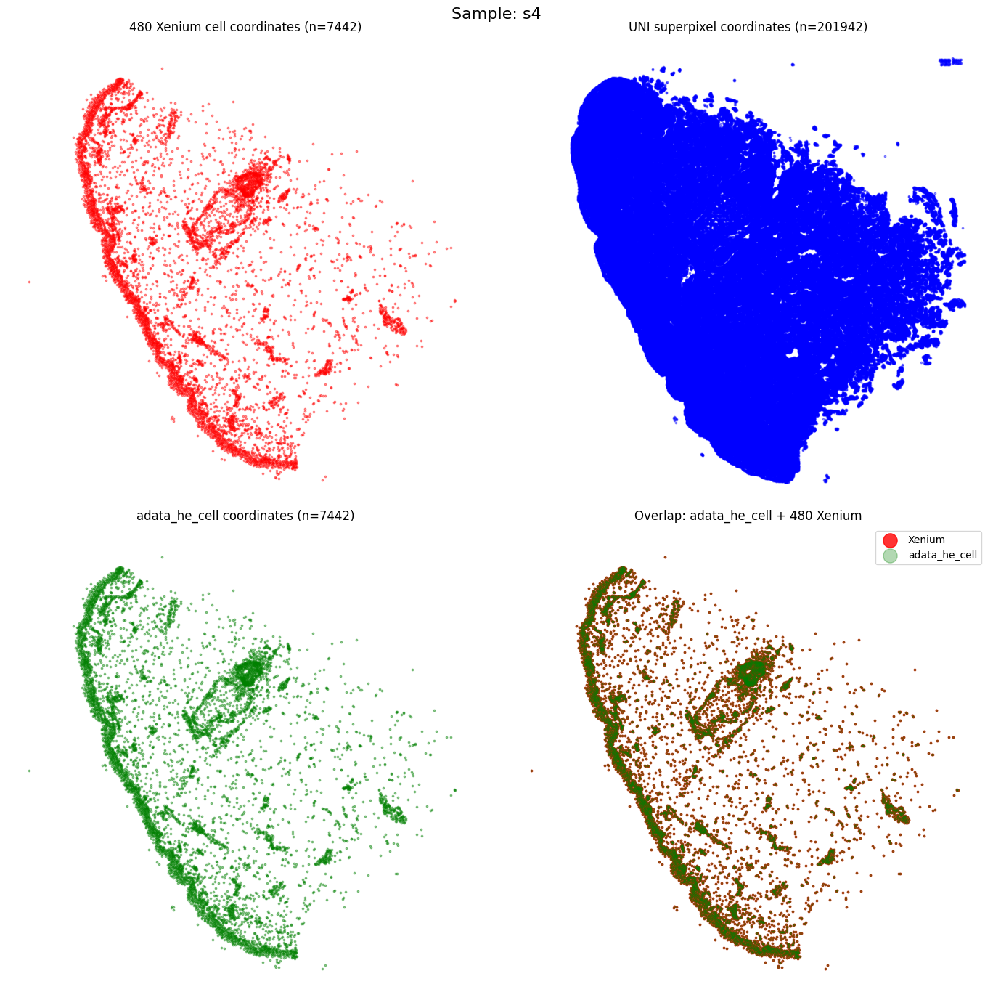


###############################################################################

Sample name: s5


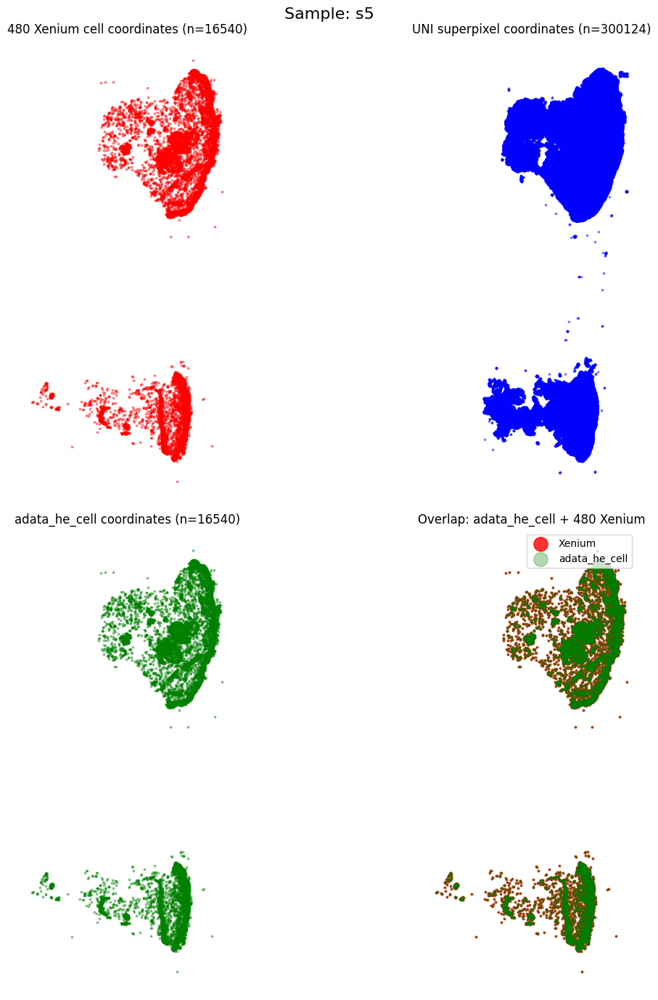


###############################################################################

Sample name: s6


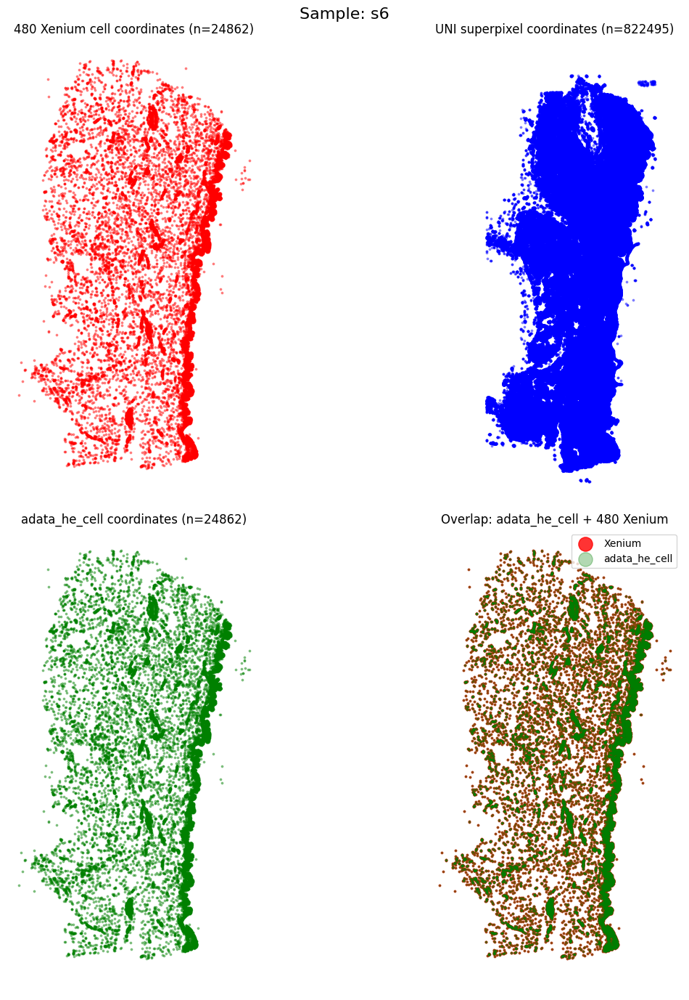

In [11]:

uni_480_list = []
for sample_name, uni_sample_name in panel_480_xenium_to_unifeature_dict.items():
    print()
    print("###############################################################################")
    print()
    print(f"Sample name: {sample_name}")

    ##########################################################################
    # Load UNI features
    adata_he = sc.read(
        CATCH_result_base_dir / "480_panel" / uni_sample_name / "480_panel" / uni_sample_name / "super_pixel_emb.h5ad"
    )
    scale_factor = 16
    adata_he.obsm["spatial"] = adata_he.obsm["spatial"] * scale_factor
    ##########################################################################

    xenium_xy = predicted_rna[sample_name].obsm["spatial"]
    uni_xy = adata_he.obsm["spatial"]

    adata_he_cell = assign_he_features_to_cells(adata_he, xenium_xy)

    # Coordinates for adata_he_cell: use its own spatial if present, else fall back to xenium coords
    if "spatial" in adata_he_cell.obsm:
        assigned_uni_xy = adata_he_cell.obsm["spatial"]
    else:
        assigned_uni_xy = xenium_xy  # cells are 1:1 with Xenium centroids

    plot_coordinate_panels(xenium_xy, uni_xy, assigned_uni_xy, sample_name)

    uni_480_list.append(adata_he_cell)

### Loading 5k


###############################################################################

Sample name: s7


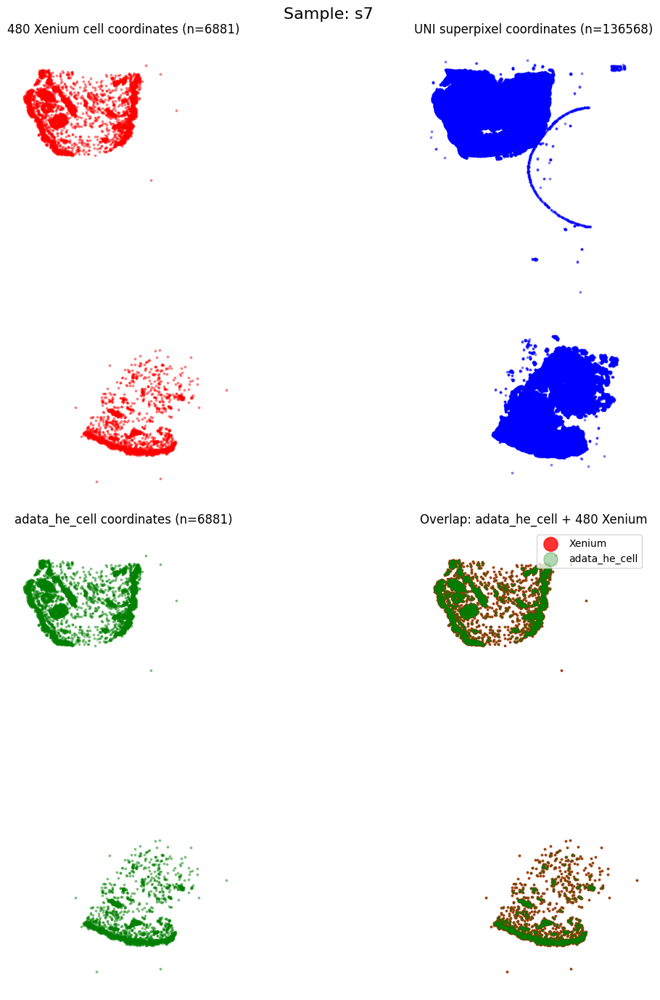


###############################################################################

Sample name: s8


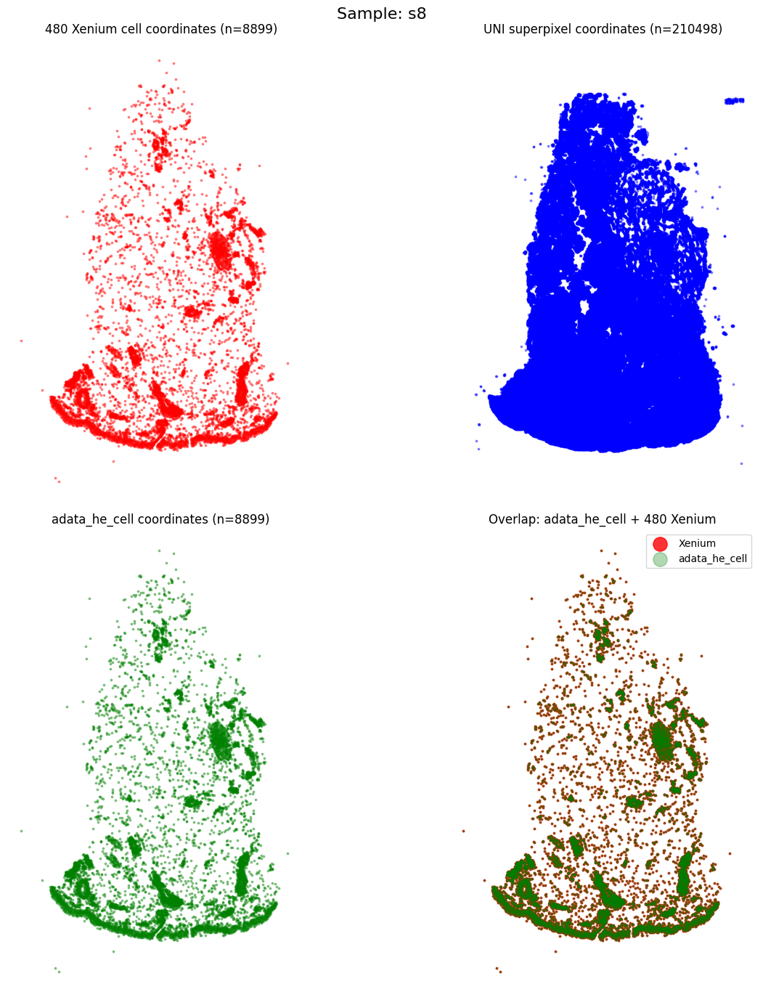


###############################################################################

Sample name: s9


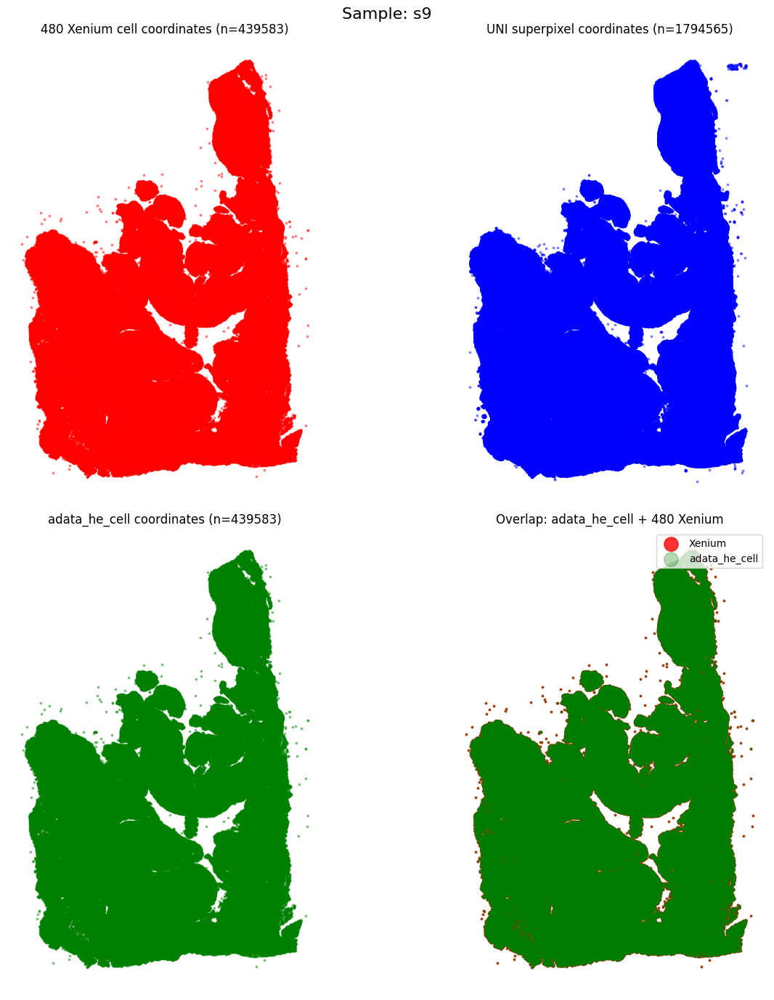


###############################################################################

Sample name: s10


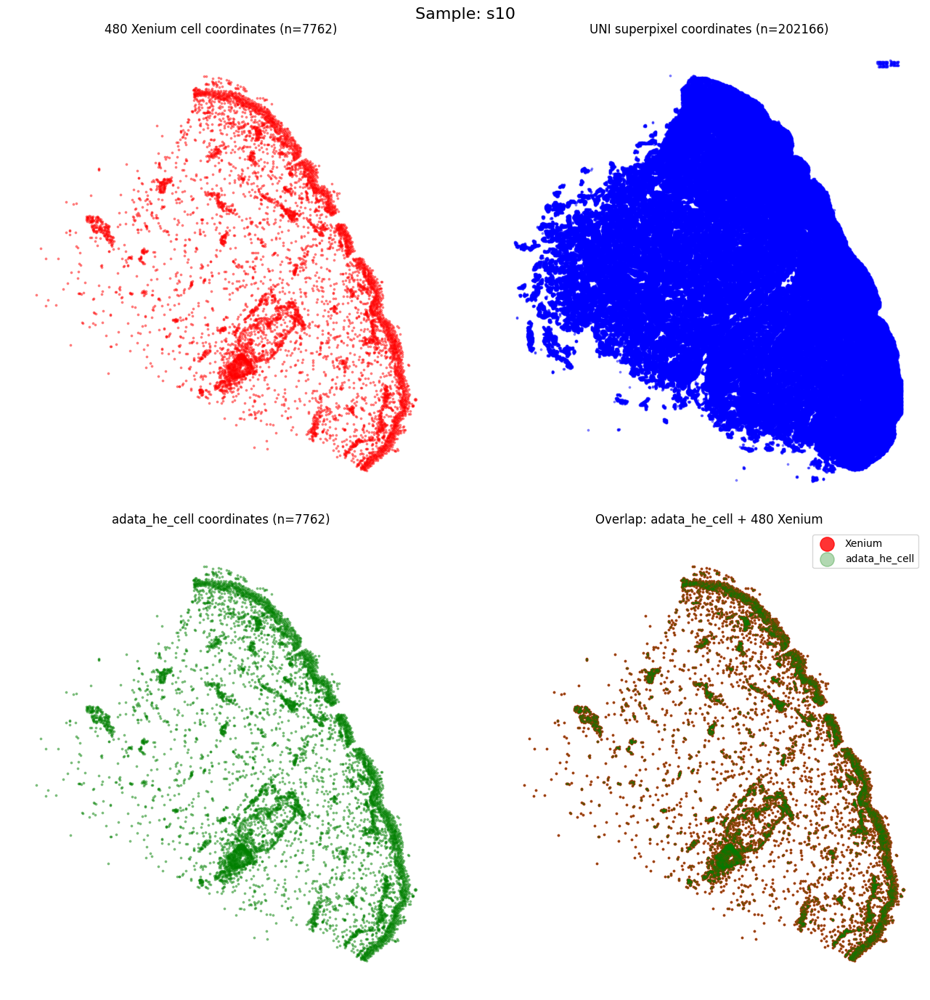


###############################################################################

Sample name: s11


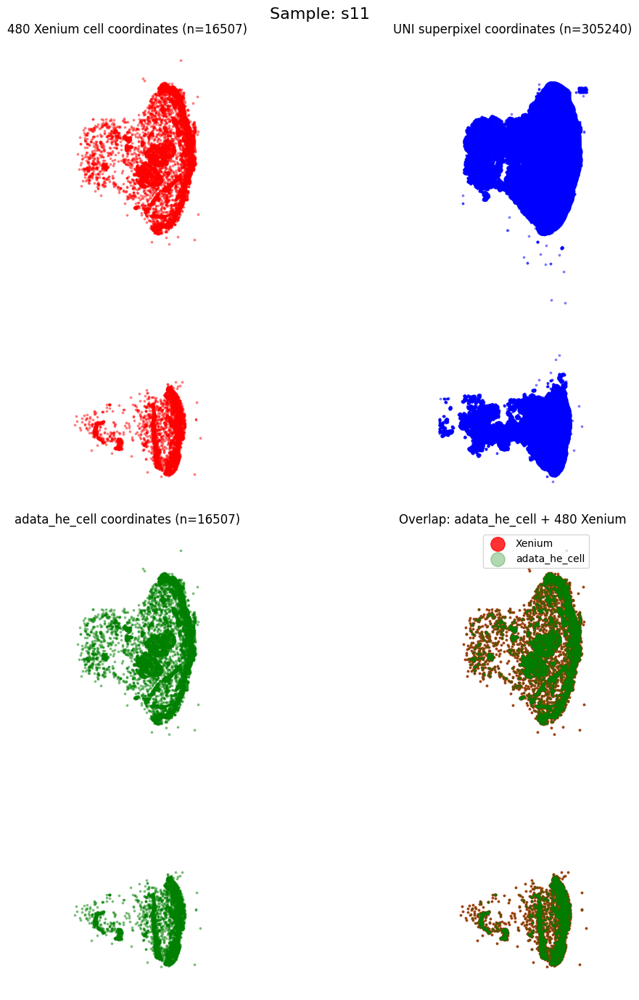


###############################################################################

Sample name: s12


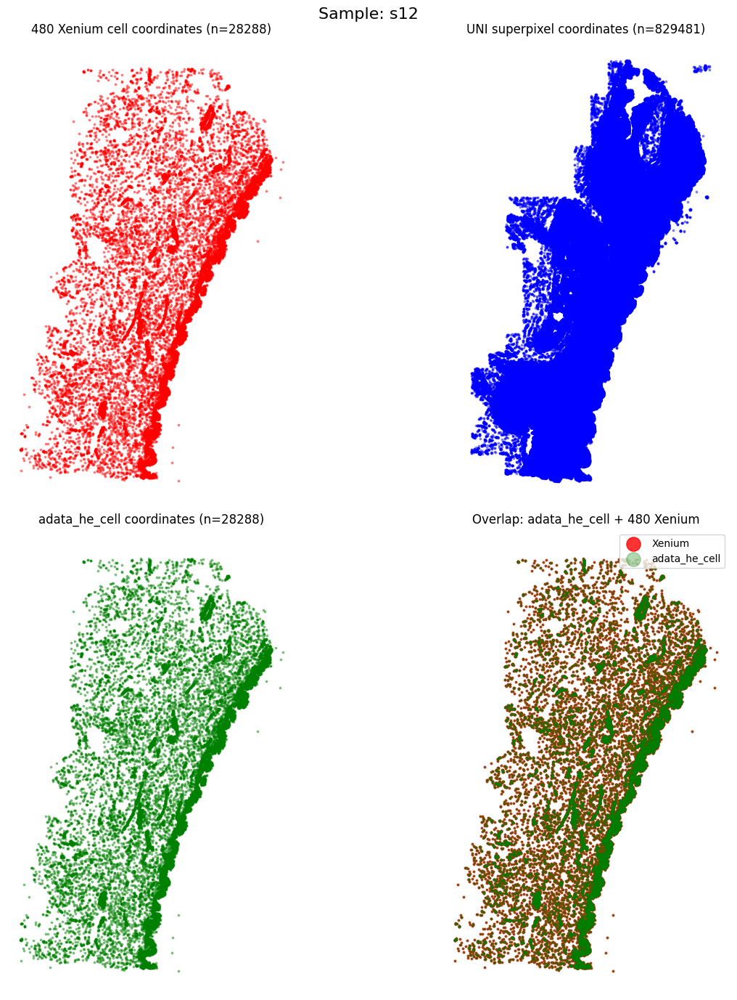

In [12]:

uni_5k_list = []
for sample_name, uni_sample_name in panel_5k_xenium_to_unifeature_dict.items():
    print()
    print("###############################################################################")
    print()
    print(f"Sample name: {sample_name}")

    ##########################################################################
    # Load UNI features
    adata_he = sc.read(
        CATCH_result_base_dir / "5k_panel" / uni_sample_name / "5k_panel" / uni_sample_name / "super_pixel_emb.h5ad"
    )
    scale_factor = 16
    adata_he.obsm["spatial"] = adata_he.obsm["spatial"] * scale_factor
    ##########################################################################

    xenium_xy = predicted_rna[sample_name].obsm["spatial"]
    uni_xy = adata_he.obsm["spatial"]

    adata_he_cell = assign_he_features_to_cells(adata_he, xenium_xy)

    # Coordinates for adata_he_cell: use its own spatial if present, else fall back to xenium coords
    if "spatial" in adata_he_cell.obsm:
        assigned_uni_xy = adata_he_cell.obsm["spatial"]
    else:
        assigned_uni_xy = xenium_xy  # cells are 1:1 with Xenium centroids

    plot_coordinate_panels(xenium_xy, uni_xy, assigned_uni_xy, sample_name)

    uni_5k_list.append(adata_he_cell)

# step 1: automatically align the data. Skip this step if they are aligned in another way

### Align cells using both coarse and fine alignment

In [13]:
from HINGE.automatic_alignment import *

PRE_ALIGNED   = False   # <- set True if externally pre-registered


ICP_TRIM_FRAC = 0.85
ICP_N_ITER    = 100
ICP_TOL       = 1e-7

In [ ]:



registration_results = {}

for name_480, name_5k in pairs:
    print(f"\n{'='*58}")
    print(f"  Aligning  {name_5k}  ->  {name_480}")
    print(f"{'='*58}")

    xy_480 = predicted_rna[name_480].obsm['spatial']
    xy_5k  = predicted_rna[name_5k].obsm['spatial']

    xy_5k_registered, A = align_section_pair(
        xy_480, xy_5k,
        pre_aligned=PRE_ALIGNED,
        trim_frac=ICP_TRIM_FRAC,
        n_iter=ICP_N_ITER,
        tol=ICP_TOL,
        pair_label=f"{name_480}/{name_5k}"
    )

    registration_results[(name_480, name_5k)] = {
        'xy_panel2_registered': xy_5k_registered,
        'A': A,
    }

update_coordinates(registration_results, pairs, uni_5k_list, predicted_rna)



  Aligning  s7  ->  s1
[s1/s7] Stage 1/2: Coarse PCA alignment...
    [coarse_align] best flip median dist: 30.07
[s1/s7] Stage 2/2: Robust affine ICP (trim_frac=0.85, n_iter=100)...
    [icp] reached max iterations, median dist (inliers): 17.32
[s1/s7] Registration quality:
    median dist : 20.20 um
    % < 10 um   : 17.4%
    % < 20 um   : 49.5%
    % > 50 um   : 20.5%  <- likely unmatched / tissue boundary

  Aligning  s8  ->  s2
[s2/s8] Stage 1/2: Coarse PCA alignment...
    [coarse_align] best flip median dist: 29.31
[s2/s8] Stage 2/2: Robust affine ICP (trim_frac=0.85, n_iter=100)...
    [icp] reached max iterations, median dist (inliers): 19.36
[s2/s8] Registration quality:
    median dist : 22.75 um
    % < 10 um   : 15.1%
    % < 20 um   : 43.9%
    % > 50 um   : 23.1%  <- likely unmatched / tissue boundary

  Aligning  s9  ->  s3
[s3/s9] Stage 1/2: Coarse PCA alignment...
    [coarse_align] best flip median dist: 16.04
[s3/s9] Stage 2/2: Robust affine ICP (trim_frac=0.85, n

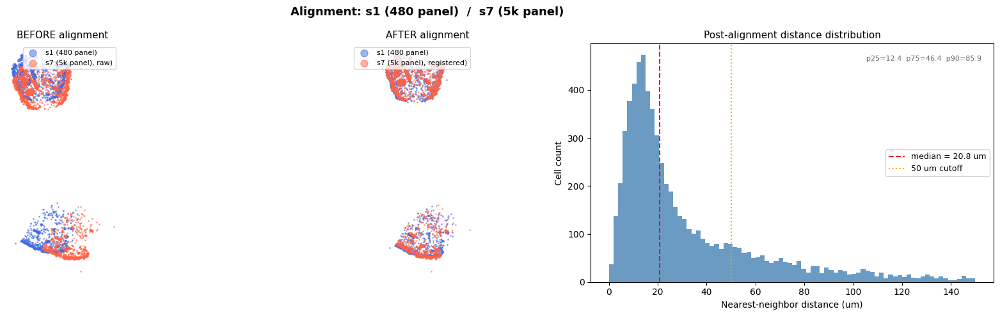

Saved: hinge_evaluation_plots/alignment_s1_s7.png


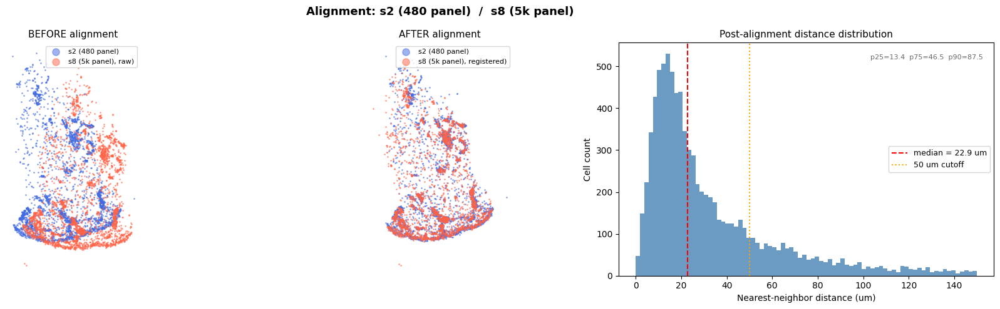

Saved: hinge_evaluation_plots/alignment_s2_s8.png


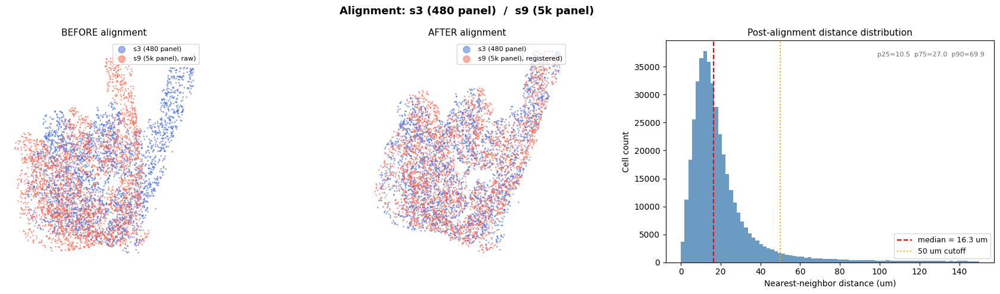

Saved: hinge_evaluation_plots/alignment_s3_s9.png


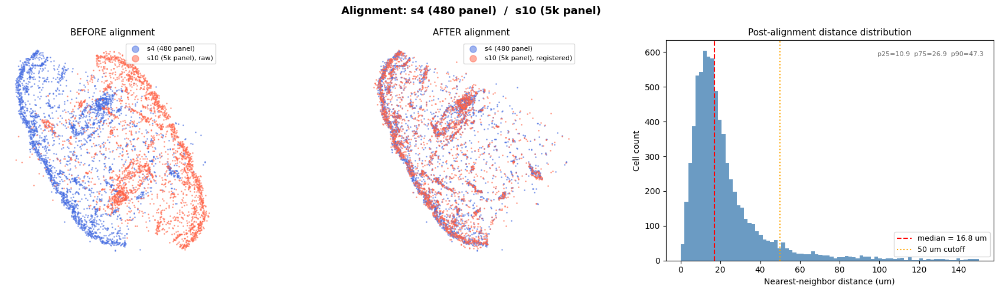

Saved: hinge_evaluation_plots/alignment_s4_s10.png


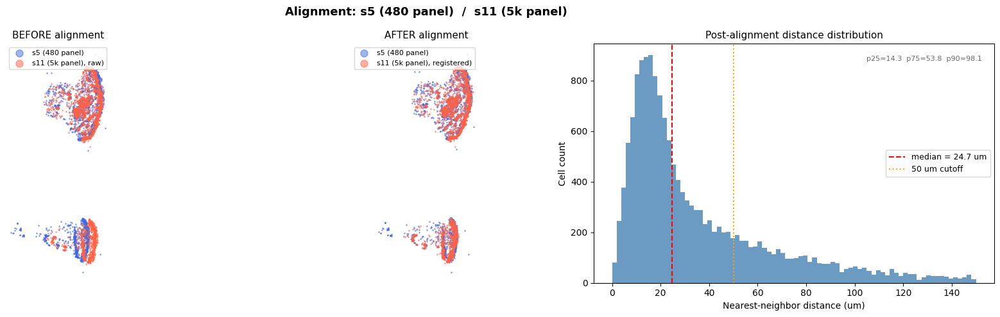

Saved: hinge_evaluation_plots/alignment_s5_s11.png


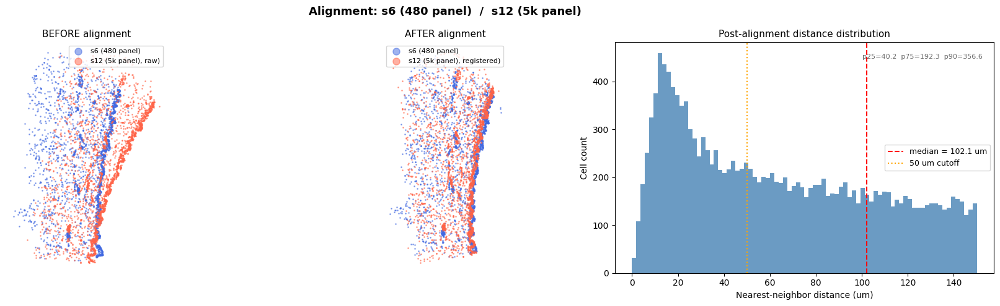

Saved: hinge_evaluation_plots/alignment_s6_s12.png


In [15]:
plot_alignment_results(pairs, predicted_rna, registration_results, SAVE_DIR)

In [16]:
uni_5k_list

[AnnData object with n_obs × n_vars = 6881 × 2048
     obs: 'nearest_superpixel_dist'
     obsm: 'spatial', 'spatial_registered',
 AnnData object with n_obs × n_vars = 8899 × 2048
     obs: 'nearest_superpixel_dist'
     obsm: 'spatial', 'spatial_registered',
 AnnData object with n_obs × n_vars = 439583 × 2048
     obs: 'nearest_superpixel_dist'
     obsm: 'spatial', 'spatial_registered',
 AnnData object with n_obs × n_vars = 7762 × 2048
     obs: 'nearest_superpixel_dist'
     obsm: 'spatial', 'spatial_registered',
 AnnData object with n_obs × n_vars = 16507 × 2048
     obs: 'nearest_superpixel_dist'
     obsm: 'spatial', 'spatial_registered',
 AnnData object with n_obs × n_vars = 28288 × 2048
     obs: 'nearest_superpixel_dist'
     obsm: 'spatial', 'spatial_registered']

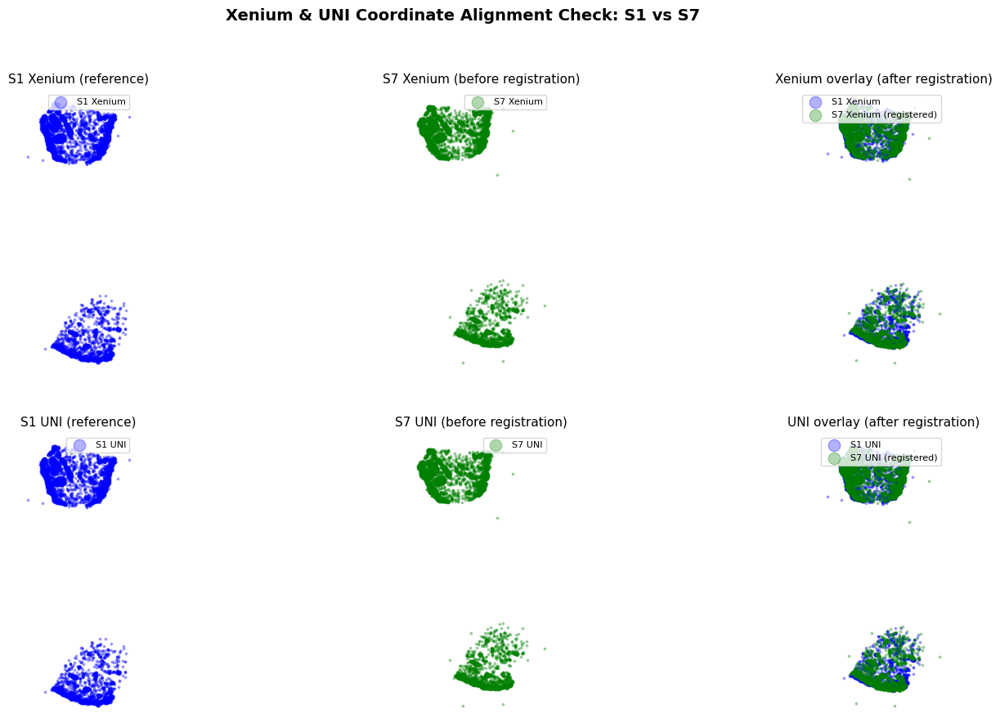

In [37]:
s = 3
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
fig.suptitle('Xenium & UNI Coordinate Alignment Check: S1 vs S7',
             fontsize=14, fontweight='bold')

# ── Row 1: Xenium cell coordinates ───────────────────────────────
axes[0, 0].scatter(
    predicted_rna['s1'].obsm['spatial'][:, 0],
    predicted_rna['s1'].obsm['spatial'][:, 1],
    s=s, c='blue', alpha=0.3, label='S1 Xenium'
)
axes[0, 0].set_title('S1 Xenium (reference)', fontsize=11)

axes[0, 1].scatter(
    predicted_rna['s7'].obsm['spatial'][:, 0],
    predicted_rna['s7'].obsm['spatial'][:, 1],
    s=s, c='green', alpha=0.3, label='S7 Xenium'
)
axes[0, 1].set_title('S7 Xenium (before registration)', fontsize=11)

axes[0, 2].scatter(
    predicted_rna['s1'].obsm['spatial'][:, 0],
    predicted_rna['s1'].obsm['spatial'][:, 1],
    s=s, c='blue', alpha=0.3, label='S1 Xenium'
)
axes[0, 2].scatter(
    predicted_rna['s7'].obsm['spatial_registered'][:, 0],
    predicted_rna['s7'].obsm['spatial_registered'][:, 1],
    s=s, c='green', alpha=0.3, label='S7 Xenium (registered)'
)
axes[0, 2].set_title('Xenium overlay (after registration)', fontsize=11)

# ── Row 2: UNI spatial coordinates ───────────────────────────────
axes[1, 0].scatter(
    uni_480_list[0].obsm['spatial'][:, 0],
    uni_480_list[0].obsm['spatial'][:, 1],
    s=s, c='blue', alpha=0.3, label='S1 UNI'
)
axes[1, 0].set_title('S1 UNI (reference)', fontsize=11)

axes[1, 1].scatter(
    uni_5k_list[0].obsm['spatial'][:, 0],
    uni_5k_list[0].obsm['spatial'][:, 1],
    s=s, c='green', alpha=0.3, label='S7 UNI'
)
axes[1, 1].set_title('S7 UNI (before registration)', fontsize=11)

axes[1, 2].scatter(
    uni_480_list[0].obsm['spatial'][:, 0],
    uni_480_list[0].obsm['spatial'][:, 1],
    s=s, c='blue', alpha=0.3, label='S1 UNI'
)
axes[1, 2].scatter(
    uni_5k_list[0].obsm['spatial_registered'][:, 0],
    uni_5k_list[0].obsm['spatial_registered'][:, 1],
    s=s, c='green', alpha=0.3, label='S7 UNI (registered)'
)
axes[1, 2].set_title('UNI overlay (after registration)', fontsize=11)

# ── Shared formatting ─────────────────────────────────────────────
row_labels = ['Xenium coords', 'UNI coords']
for row, label in enumerate(row_labels):
    axes[row, 0].set_ylabel(label, fontsize=11, fontweight='bold')

for ax in axes.ravel():
    ax.set_aspect('equal')
    ax.axis('off')
    ax.legend(markerscale=6, fontsize=8, loc='upper right')

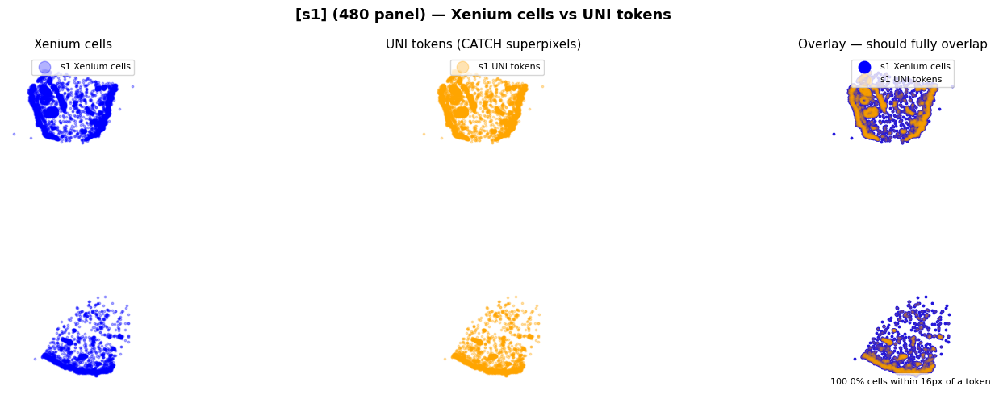

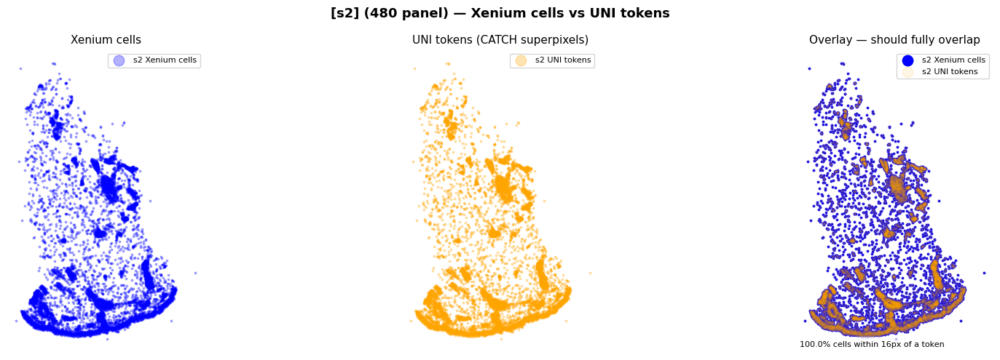

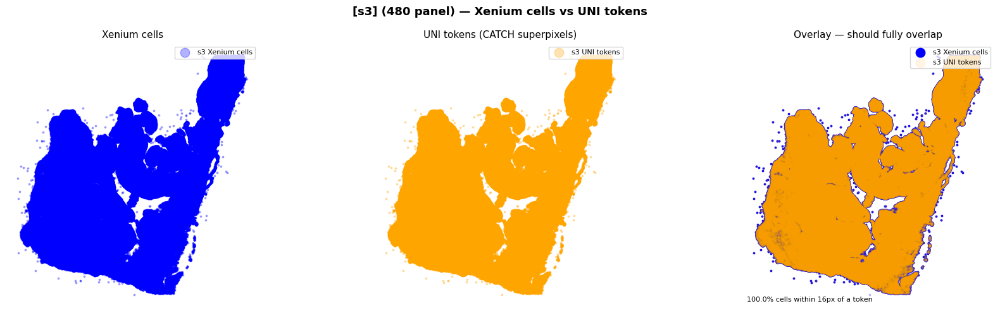

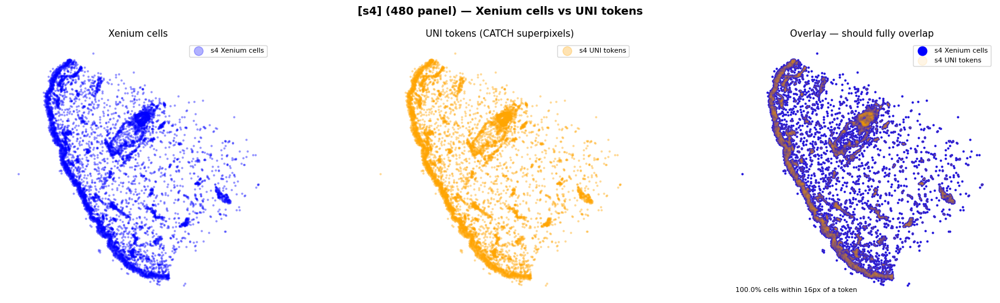

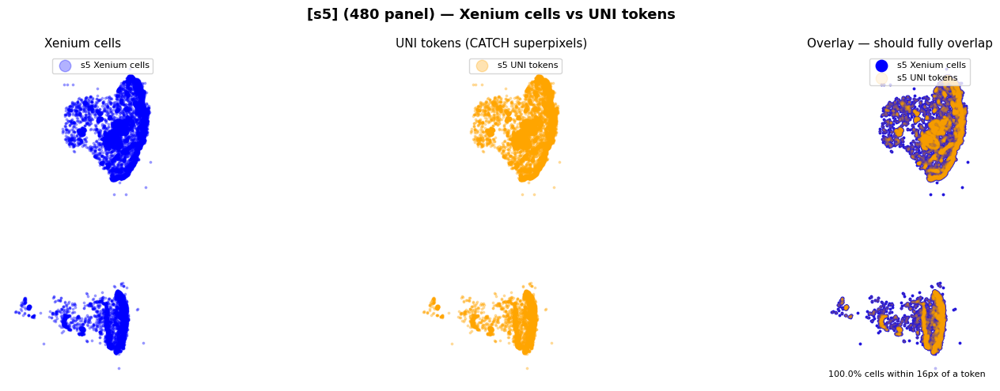

...

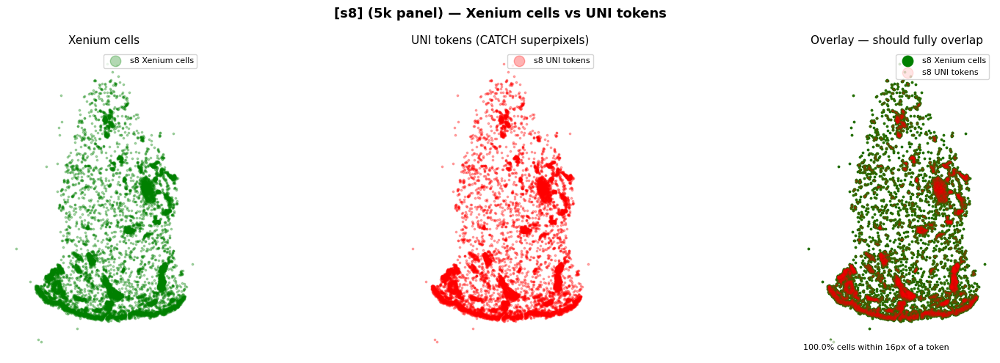

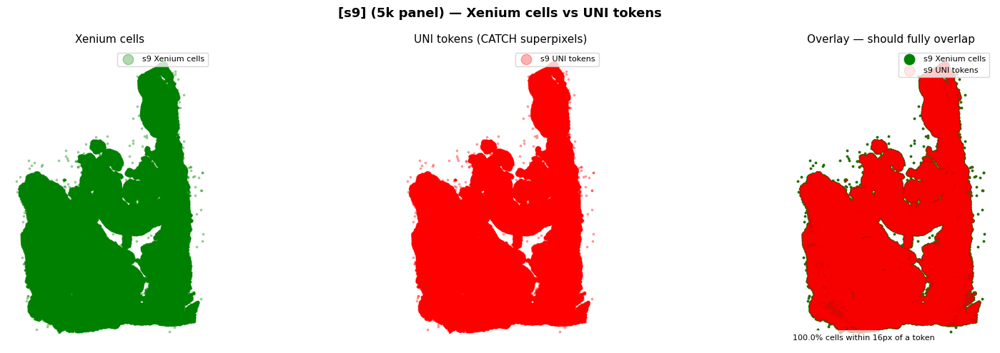

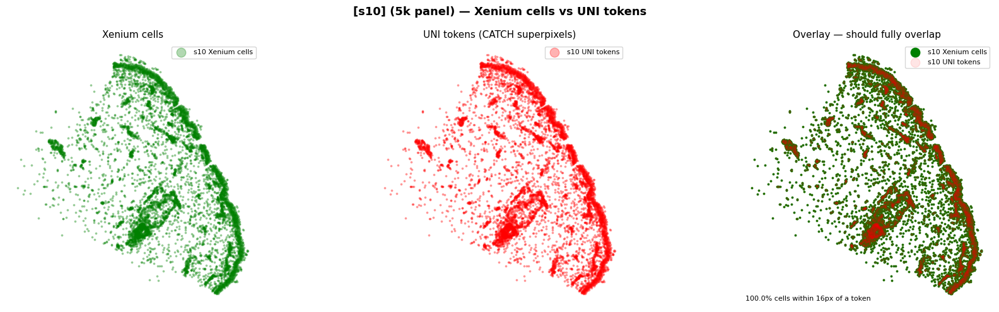

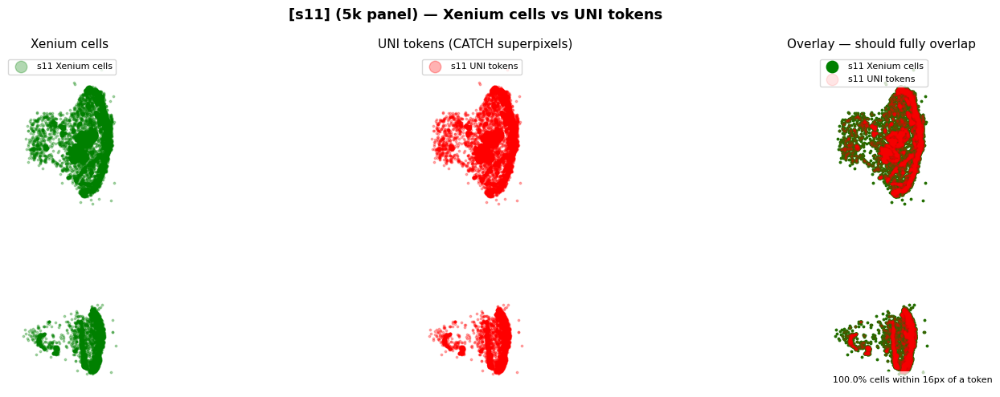

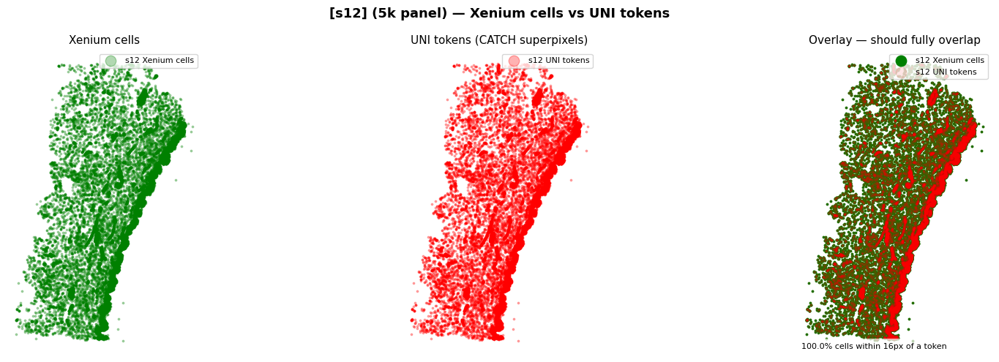

In [41]:

# ── Individual per-sample comparison plots ────────────────────────
# One figure per sample: Xenium | UNI | Overlay side by side

all_samples = [
    ('s1',  uni_480_list[0], 'blue',   'orange', '480 panel'),
    ('s2',  uni_480_list[1], 'blue',   'orange', '480 panel'),
    ('s3',  uni_480_list[2], 'blue',   'orange', '480 panel'),
    ('s4',  uni_480_list[3], 'blue',   'orange', '480 panel'),
    ('s5',  uni_480_list[4], 'blue',   'orange', '480 panel'),
    ('s6',  uni_480_list[5], 'blue',   'orange', '480 panel'),
    ('s7',  uni_5k_list[0],  'green',  'red',    '5k panel'),
    ('s8',  uni_5k_list[1],  'green',  'red',    '5k panel'),
    ('s9',  uni_5k_list[2],  'green',  'red',    '5k panel'),
    ('s10', uni_5k_list[3],  'green',  'red',    '5k panel'),
    ('s11', uni_5k_list[4],  'green',  'red',    '5k panel'),
    ('s12', uni_5k_list[5],  'green',  'red',    '5k panel'),
]

for name, uni_adata, c_xenium, c_uni, panel_label in all_samples:

    xenium_xy = predicted_rna[name].obsm['spatial']
    uni_xy    = uni_adata.obsm['spatial']

    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    fig.suptitle(f'[{name}] ({panel_label}) — Xenium cells vs UNI tokens',
                 fontsize=13, fontweight='bold')

    # Panel 1: Xenium cells
    axes[0].scatter(*xenium_xy.T, s=s, c=c_xenium, alpha=0.3,
                    label=f'{name} Xenium cells')
    axes[0].set_title('Xenium cells', fontsize=11)

    # Panel 2: UNI tokens
    axes[1].scatter(*uni_xy.T, s=s, c=c_uni, alpha=0.3,
                    label=f'{name} UNI tokens')
    axes[1].set_title('UNI tokens (CATCH superpixels)', fontsize=11)

    # Panel 3: Overlay
    axes[2].scatter(*xenium_xy.T, s=s, c=c_xenium, alpha=1,
                    label=f'{name} Xenium cells')
    axes[2].scatter(*uni_xy.T,    s=s, c=c_uni,    alpha=0.1,
                    label=f'{name} UNI tokens')
    axes[2].set_title('Overlay — should fully overlap', fontsize=11)

    # Annotate with overlap quality metric
    # (what fraction of Xenium cells have a UNI token within 16px)
    tree      = cKDTree(uni_xy)
    dist, _   = tree.query(xenium_xy, k=1)
    pct_close = (dist < 16).mean()
    axes[2].text(0.02, 0.02,
                 f'{pct_close:.1%} cells within 16px of a token',
                 transform=axes[2].transAxes,
                 fontsize=8, color='black',
                 bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))

    for ax in axes:
        ax.set_aspect('equal')
        ax.axis('off')
        ax.legend(markerscale=6, fontsize=8, loc='upper right')

    plt.tight_layout()
    plt.show()

## evaluate coordinates

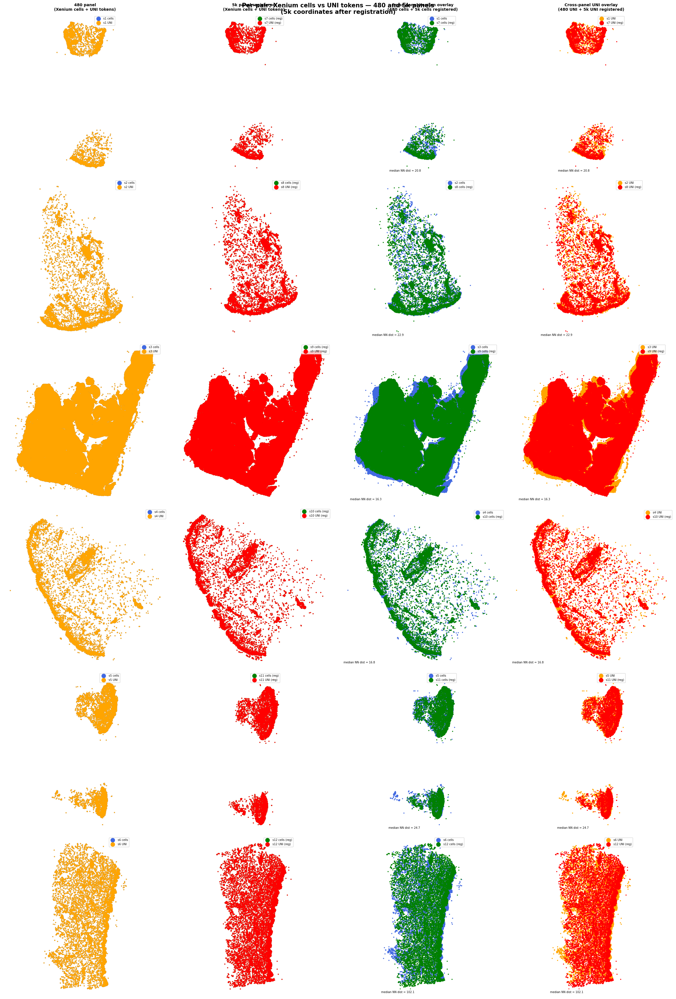

In [44]:
s = 3

pairs_with_uni = [
    ('s1', 's7',  uni_480_list[0], uni_5k_list[0]),
    ('s2', 's8',  uni_480_list[1], uni_5k_list[1]),
    ('s3', 's9',  uni_480_list[2], uni_5k_list[2]),
    ('s4', 's10', uni_480_list[3], uni_5k_list[3]),
    ('s5', 's11', uni_480_list[4], uni_5k_list[4]),
    ('s6', 's12', uni_480_list[5], uni_5k_list[5]),
]

fig, axes = plt.subplots(6, 4, figsize=(24, 36))
fig.suptitle('Per-pair: Xenium cells vs UNI tokens — 480 and 5k panels\n'
             '(5k coordinates after registration)',
             fontsize=15, fontweight='bold')

col_titles = [
    '480 panel\n(Xenium cells + UNI tokens)',
    '5k panel registered\n(Xenium cells + UNI tokens)',
    'Cross-panel Xenium overlay\n(480 cells + 5k cells registered)',
    'Cross-panel UNI overlay\n(480 UNI + 5k UNI registered)',
]
for col, title in enumerate(col_titles):
    axes[0, col].set_title(title, fontsize=10, fontweight='bold', pad=10)

for row, (name_480, name_5k, uni_480, uni_5k) in enumerate(pairs_with_uni):

    xenium_480 = predicted_rna[name_480].obsm['spatial']
    xenium_5k  = predicted_rna[name_5k].obsm['spatial_registered']
    uni_480_xy = uni_480.obsm['spatial']
    uni_5k_xy  = uni_5k.obsm['spatial_registered']

    # ── Col 1: 480 Xenium cells + 480 UNI tokens ─────────────────
    ax = axes[row, 0]
    ax.scatter(*xenium_480.T, s=s, c='royalblue', alpha=1,
               label=f'{name_480} cells')
    ax.scatter(*uni_480_xy.T, s=s, c='orange',    alpha=1,
               label=f'{name_480} UNI')
    ax.set_ylabel(f'{name_480} / {name_5k}', fontsize=10, fontweight='bold')

    # ── Col 2: 5k Xenium cells (registered) + 5k UNI (registered)
    ax = axes[row, 1]
    ax.scatter(*xenium_5k.T,  s=s, c='green',  alpha=1,
               label=f'{name_5k} cells (reg)')
    ax.scatter(*uni_5k_xy.T,  s=s, c='red',    alpha=1,
               label=f'{name_5k} UNI (reg)')

    # ── Col 3: Cross-panel Xenium cells overlay ───────────────────
    ax = axes[row, 2]
    ax.scatter(*xenium_480.T, s=s, c='royalblue', alpha=1,
               label=f'{name_480} cells')
    ax.scatter(*xenium_5k.T,  s=s, c='green',     alpha=1,
               label=f'{name_5k} cells (reg)')

    # ── Col 4: Cross-panel UNI overlay ───────────────────────────
    ax = axes[row, 3]
    ax.scatter(*uni_480_xy.T, s=s, c='orange',alpha=1,
               label=f'{name_480} UNI')
    ax.scatter(*uni_5k_xy.T,  s=s, c='red',    alpha=1,
               label=f'{name_5k} UNI (reg)')

    # Annotate col 3 and col 4 with median NN distance
    for col_idx, (xy_ref, xy_query, label) in enumerate([
        (xenium_480, xenium_5k, 'Xenium'),
        (uni_480_xy, uni_5k_xy, 'UNI')
    ]):
        tree      = cKDTree(xy_query)
        dist, _   = tree.query(xy_ref, k=1)
        med_dist  = np.median(dist)
        axes[row, col_idx + 2].text(
            0.02, 0.02,
            f'median NN dist = {med_dist:.1f}',
            transform=axes[row, col_idx + 2].transAxes,
            fontsize=7, color='black',
            bbox=dict(facecolor='white', alpha=0.7, edgecolor='none')
        )

# ── Shared formatting ─────────────────────────────────────────────
for ax in axes.ravel():
    ax.set_aspect('equal')
    ax.axis('off')
    ax.legend(markerscale=6, fontsize=7, loc='upper right')

plt.tight_layout()
plt.show()

In [47]:
for pair_idx, (name_480, name_5k) in enumerate(pairs):

    print(f"\n{'='*55}")
    print(f"  Pair: {name_480} / {name_5k}")
    print(f"{'='*55}")

    # ── 480 panel ─────────────────────────────────────────────────
    cell_480_first = predicted_rna[name_480].obsm['spatial'][0]
    uni_480_first  = uni_480_list[pair_idx].obsm['spatial'][0]
    diff_480       = np.abs(cell_480_first - uni_480_first)

    print(f"\n  [{name_480}] 480 panel:")
    print(f"    cell[0] coords : {cell_480_first}")
    print(f"    UNI[0]  coords : {uni_480_first}")
    print(f"    difference     : {diff_480}  →  max={diff_480.max():.6f}")
    print(f"    match          : {'YES' if diff_480.max() < 1e-3 else 'NO'}")

    # ── 5k panel ──────────────────────────────────────────────────
    cell_5k_first = predicted_rna[name_5k].obsm['spatial_registered'][0]
    uni_5k_first  = uni_5k_list[pair_idx].obsm['spatial_registered'][0]
    diff_5k       = np.abs(cell_5k_first - uni_5k_first)

    print(f"\n  [{name_5k}] 5k panel:")
    print(f"    cell[0] coords : {cell_5k_first}")
    print(f"    UNI[0]  coords : {uni_5k_first}")
    print(f"    difference     : {diff_5k}  →  max={diff_5k.max():.6f}")
    print(f"    match          : {' YES' if diff_5k.max() < 1e-3 else 'NO'}")


  Pair: s1 / s7

  [s1] 480 panel:
    cell[0] coords : [ 1754.3195 21392.053 ]
    UNI[0]  coords : [ 1754.3195 21392.053 ]
    difference     : [0. 0.]  →  max=0.000000
    match          : YES

  [s7] 5k panel:
    cell[0] coords : [ 1606.4667692  21499.67549433]
    UNI[0]  coords : [ 1606.4667692  21499.67549433]
    difference     : [0. 0.]  →  max=0.000000
    match          :  YES

  Pair: s2 / s8

  [s2] 480 panel:
    cell[0] coords : [ 1101.946 14436.337]
    UNI[0]  coords : [ 1101.946 14436.337]
    difference     : [0. 0.]  →  max=0.000000
    match          : YES

  [s8] 5k panel:
    cell[0] coords : [ 2537.44684732 14433.65449844]
    UNI[0]  coords : [ 2537.44684732 14433.65449844]
    difference     : [0. 0.]  →  max=0.000000
    match          :  YES

  Pair: s3 / s9

  [s3] 480 panel:
    cell[0] coords : [30949.604 36046.06 ]
    UNI[0]  coords : [30949.604 36046.06 ]
    difference     : [0. 0.]  →  max=0.000000
    match          : YES

  [s9] 5k panel:
    cel

In [53]:


sample_names_panel1 = ['s1', 's2', 's3', 's4', 's5', 's6']
sample_names_panel2 = ['s7', 's8', 's9', 's10', 's11', 's12']

save_dict = {
    'RNA_panel1'           : {name: predicted_rna[name] for name in sample_names_panel1},
    'RNA_panel2'           : {name: predicted_rna[name] for name in sample_names_panel2},
    'HE_panel1'            : uni_480_list,
    'HE_panel2'            : uni_5k_list
}

with open(SAVE_DIR / 'checkpoint_step1.pkl', 'wb') as f:
    pickle.dump(save_dict, f, protocol=pickle.HIGHEST_PROTOCOL)

# Step 2: extract

In [4]:
%load_ext autoreload
%autoreload 2

In [5]:
from HINGE.feature_mapping import *


In [6]:
with open(SAVE_DIR / 'checkpoint_step1.pkl', "rb") as f:
    data_dict=pickle.load(f)

data_dict

{'RNA_panel1': {'s1': AnnData object with n_obs × n_vars = 6989 × 5101
      obs: 'nearest_superpixel_dist'
      var: 'gene_ids', 'feature_types', 'genome'
      obsm: 'spatial',
  's2': AnnData object with n_obs × n_vars = 8978 × 5101
      obs: 'nearest_superpixel_dist'
      var: 'gene_ids', 'feature_types', 'genome'
      obsm: 'spatial',
  's3': AnnData object with n_obs × n_vars = 449221 × 5101
      obs: 'nearest_superpixel_dist'
      var: 'gene_ids', 'feature_types', 'genome'
      obsm: 'spatial',
  's4': AnnData object with n_obs × n_vars = 7442 × 5101
      obs: 'nearest_superpixel_dist'
      var: 'gene_ids', 'feature_types', 'genome'
      obsm: 'spatial',
  's5': AnnData object with n_obs × n_vars = 16540 × 5101
      obs: 'nearest_superpixel_dist'
      var: 'gene_ids', 'feature_types', 'genome'
      obsm: 'spatial',
  's6': AnnData object with n_obs × n_vars = 24862 × 5101
      obs: 'nearest_superpixel_dist'
      var: 'gene_ids', 'feature_types', 'genome'
      obs

In [7]:
#select which sample to use for the mapping

uni_480_list = data_dict['HE_panel1'][0:1]  # only the first sample for demonstration
uni_5k_list = data_dict['HE_panel2'][0:1]  # only the first sample for demonstration
rna_480_list = [data_dict['RNA_panel1']['s1']]  # only the first sample for demonstration
rna_5k_list = [data_dict['RNA_panel2']['s7']]  # only the first sample for demonstration

In [8]:
uni_480_list

[AnnData object with n_obs × n_vars = 6989 × 2048
     obs: 'nearest_superpixel_dist'
     obsm: 'spatial']

In [9]:
uni_5k_list

[AnnData object with n_obs × n_vars = 6881 × 2048
     obs: 'nearest_superpixel_dist'
     obsm: 'spatial', 'spatial_registered']

In [10]:
rna_480_list

[AnnData object with n_obs × n_vars = 6989 × 5101
     obs: 'nearest_superpixel_dist'
     var: 'gene_ids', 'feature_types', 'genome'
     obsm: 'spatial']

In [11]:
rna_5k_list

[AnnData object with n_obs × n_vars = 6881 × 480
     obs: 'nearest_superpixel_dist'
     var: 'gene_ids', 'feature_types', 'genome'
     obsm: 'spatial', 'spatial_registered']

  70% variance retained: 122 components
  80% variance retained: 232 components
  90% variance retained: 479 components
  95% variance retained: 764 components


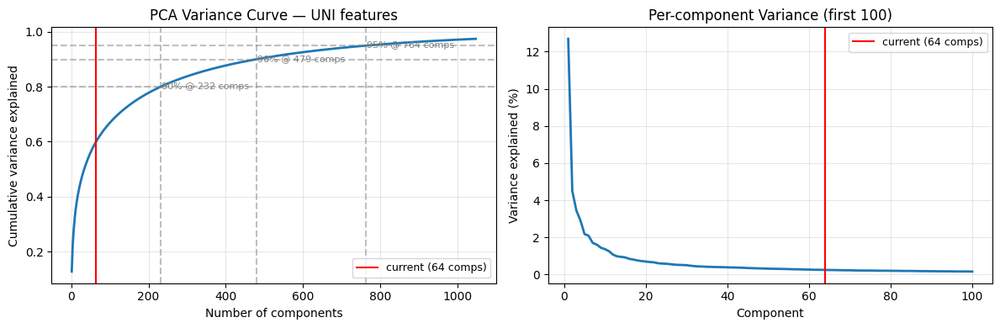

In [12]:
def plot_pca_variance_curve(uni_panel1_list, uni_panel2_list,
                             max_comps=200):
    """
    Plot cumulative variance explained vs n_components.
    Helps choose the right n_pca_comps.
    """
    all_X = []
    for adata in uni_panel1_list + uni_panel2_list:
        X = adata.X.toarray() if issparse(adata.X) else np.array(adata.X)
        all_X.append(X.astype(np.float32))
    all_X = np.vstack(all_X)

    n_comps = min(max_comps, all_X.shape[1] - 1, all_X.shape[0] - 1)
    pca     = PCA(n_components=n_comps, random_state=42)
    pca.fit(all_X)

    cumvar = np.cumsum(pca.explained_variance_ratio_)

    fig, axes = plt.subplots(1, 2, figsize=(12, 4))

    # Cumulative variance
    axes[0].plot(range(1, n_comps + 1), cumvar, linewidth=2)
    for threshold in [0.80, 0.90, 0.95]:
        n_needed = np.searchsorted(cumvar, threshold) + 1
        axes[0].axhline(threshold, color='gray', linestyle='--', alpha=0.5)
        axes[0].axvline(n_needed,  color='gray', linestyle='--', alpha=0.5)
        axes[0].text(n_needed + 2, threshold - 0.01,
                     f'{threshold:.0%} @ {n_needed} comps',
                     fontsize=8, color='gray')
    axes[0].axvline(64, color='red', linestyle='-', linewidth=1.5,
                    label='current (64 comps)')
    axes[0].set_xlabel('Number of components')
    axes[0].set_ylabel('Cumulative variance explained')
    axes[0].set_title('PCA Variance Curve — UNI features')
    axes[0].legend(fontsize=9)
    axes[0].grid(alpha=0.3)

    # Per-component variance (elbow plot)
    axes[1].plot(range(1, min(100, n_comps) + 1),
                 pca.explained_variance_ratio_[:100] * 100,
                 linewidth=2)
    axes[1].axvline(64, color='red', linestyle='-', linewidth=1.5,
                    label='current (64 comps)')
    axes[1].set_xlabel('Component')
    axes[1].set_ylabel('Variance explained (%)')
    axes[1].set_title('Per-component Variance (first 100)')
    axes[1].legend(fontsize=9)
    axes[1].grid(alpha=0.3)

    # Print summary
    for threshold in [0.70, 0.80, 0.90, 0.95]:
        n_needed = np.searchsorted(cumvar, threshold) + 1
        print(f"  {threshold:.0%} variance retained: {n_needed} components")

    plt.tight_layout()

    plt.show()

    return pca, cumvar

pca_diagnostic, cumvar = plot_pca_variance_curve(
     data_dict['HE_panel1'][0:2],  data_dict['HE_panel2'][0:2], max_comps=1048
)

In [19]:



# ── Prepare features ──────────────────────────────────────────────────────
morph_480_list, morph_5k_list, morph_pca = prepare_morphology_features(
    uni_480_list, uni_5k_list, n_pca_comps=1024
)


  Preparing morphology features (UNI embeddings)
combining UNI features from both panels...
  Fitting PCA on (13870, 2048) UNI features → 1024 components...
  Variance retained: 98.1%
panel 1 morph (6989, 1024), panel 2 morph (6881, 1024)


In [20]:
morph_480_list

[array([[-2.80818880e-01,  1.07447971e-02, -2.65478790e-01, ...,
          5.36711421e-03, -3.35117732e-03,  3.95892840e-03],
        [-1.68517813e-01,  2.44093835e-01, -1.32799581e-01, ...,
          9.87996254e-03, -1.35817975e-02,  1.71148323e-03],
        [-2.00639784e-01,  2.00175151e-01, -1.97116897e-01, ...,
          1.88942719e-03, -6.45273132e-03, -9.08608176e-03],
        ...,
        [ 3.31175327e-01, -3.07782292e-01,  2.54053086e-01, ...,
          4.45821555e-04,  1.96984940e-04, -1.05943705e-03],
        [ 3.86526227e-01, -2.44196862e-01,  2.22664699e-01, ...,
         -3.36951134e-03,  1.23098232e-02, -2.36788997e-03],
        [ 4.09008652e-01, -2.40639314e-01,  2.22488150e-01, ...,
         -1.92474958e-03,  8.36199708e-03, -1.84782175e-03]], dtype=float32)]

In [21]:
morph_5k_list

[array([[-3.2109436e-01, -4.3432525e-01, -1.9264366e-02, ...,
         -6.3663372e-03, -1.3628872e-02,  2.2183149e-04],
        [-3.8131341e-01, -1.6995008e-01, -1.4126043e-01, ...,
         -3.6547107e-03, -7.6815025e-03, -3.9535272e-04],
        [-3.8258922e-01, -2.0929548e-01, -7.4457727e-02, ...,
         -1.0265103e-03, -7.7391285e-03,  1.8073603e-03],
        ...,
        [ 3.9922833e-01, -2.7402741e-01,  2.5543538e-01, ...,
          6.6250591e-03, -7.6600378e-03, -1.4066531e-02],
        [ 3.9922833e-01, -2.7402741e-01,  2.5543538e-01, ...,
          6.6250591e-03, -7.6600378e-03, -1.4066531e-02],
        [ 4.2602170e-01, -2.5376901e-01,  2.4805583e-01, ...,
         -5.8087800e-03, -1.4410419e-02,  2.3383859e-03]], dtype=float32)]

In [25]:

expr_480_list, expr_5k_list, expr_pca, overlap_genes = prepare_expression_features(
    rna_480_list,rna_5k_list, n_comps=64
)


  Preparing expression features (overlapping genes PCA)
  Overlapping genes across all samples: 444
  Fitting expression PCA on (6989, 444) → 64 components...
  Variance retained: 94.8%
Panel 1 expr (6989, 64), Panel 2 expr (6989, 64)


In [ ]:
step2_save_dict = {
    'RNA_extracted_panel1'           : expr_480_list,
    'RNA_extracted_panel2'           : expr_5k_list,
    'HE_extracted_panel1'            : morph_480_list,
    'HE_extracted_panel2'            : morph_5k_list,
    'RNA_panel1'                     :rna_480_list ,
    "RNA_panel2"                     :rna_5k_list
}
SAVE_DIR = Path('./hinge_checkpoints')
SAVE_DIR.mkdir(exist_ok=True)
with open(SAVE_DIR / 'checkpoint_step2.pkl', 'wb') as f:
    pickle.dump(step2_save_dict, f, protocol=pickle.HIGHEST_PROTOCOL)

# Step 3:match

In [ ]:
from HINGE.evaluation import *
from HINGE.matching_with_global_assignment import *

In [ ]:


# ── Config ────────────────────────────────────────────────────────────────
CELLTYPE_COL  = 'cell_type'   # ← adjust to your obs column name
MAX_DIST      = 50.0           # μm — spatial search radius
K_CANDIDATES  = 20             # spatial candidates per cell
K_NEIGHBORS   = 15             # neighborhood size for consistency


STRATEGY_LABELS = {
    'A_distance'  : 'Distance\nonly',
    'B_histology' : 'Histology\nonly',
    'C_expression': 'Expression\nonly',
    'D_combined'  : 'Histology +\nExpression',
}
STRATEGY_COLORS = {
    'A_distance'  : '#95a5a6',
    'B_histology' : '#3498db',
    'C_expression': '#2ecc71',
    'D_combined'  : '#e74c3c',
}


In [ ]:
with open(SAVE_DIR / 'checkpoint_step2.pkl', "rb") as f:
    data_dict=pickle.load(f)

data_dict

In [ ]:


# ── Run matching + evaluation for all pairs ───────────────────────────────
strategies       = list(STRATEGY_LABELS.keys())
all_eval_scores  = {s: [] for s in strategies}   # pooled across all pairs
per_pair_scores  = {}                             # per pair breakdown

for idx in range(data_dict['RNA_extracted_panel1'].__len__()):
    print(f"\n{'='*58}")
    print(f"  Processing pair {idx}")
    print(f"{'='*58}")

    xy_panel1    = data_dict['RNA_extracted_panel1'][idx].obsm['spatial']
    xy_panel2_reg = data_dict['RNA_extracted_panel2'][idx].obsm['spatial_registered']

    # Run all matching strategies
    match_results = run_all_strategies(
        xy_panel1       = xy_panel1,
        xy_panel2_reg   = xy_panel2_reg,
        morph_480    = data_dict['HE_extracted_panel1'][idx],
        morph_5k     = data_dict['HE_extracted_panel2'][idx],
        expr_480     = data_dict["RNA_extracted_panel1"][idx].X,
        expr_5k      = data_dict["RNA_extracted_panel2"][idx].X,
        max_dist     = MAX_DIST,
        k_candidates = K_CANDIDATES
    )




    # Evaluate each strategy

    per_pair_scores[idx] = {}
    print(f"\n  Evaluating neighborhood consistency ({CELLTYPE_COL})...")

    for strategy, (idx_480, idx_5k) in match_results.items():
        scores = compute_neighborhood_consistency(
            xy_panel1       = xy_panel1,
            xy_panel2_reg    = xy_panel2_reg,
            idx_480      = idx_480,
            idx_5k       = idx_5k,
            adata_panel1    = data_dict["RNA_panel1"][idx],
            adata_panel2     = data_dict["RNA_panel2"][idx],
            k_neighbors  = K_NEIGHBORS,
            celltype_col = CELLTYPE_COL
        )
        per_pair_scores[idx][strategy] = scores
        all_eval_scores[strategy].extend(scores.tolist())
        print(f"  {STRATEGY_LABELS[strategy].replace(chr(10),' '):<25} "
              f"median = {np.median(scores):.4f}  (n={len(scores)})")





In [ ]:
# ── Visualize ─────────────────────────────────────────────────────────────
plot_ablation_summary(all_eval_scores)

In [ ]:
plot_ablation_per_pair(per_pair_scores, pairs)

In [ ]:
print_summary_table(all_eval_scores, per_pair_scores, pairs)

In [ ]:

# ── Save checkpoint ───────────────────────────────────────────────────────
step2_checkpoint = {
    'all_eval_scores' : all_eval_scores,
    'per_pair_scores' : per_pair_scores,
    'morph_480_list'  : morph_480_list,
    'morph_5k_list'   : morph_5k_list,
    'expr_480_list'   : expr_480_list,
    'expr_5k_list'    : expr_5k_list,
    'overlap_genes'   : overlap_genes,
    'config': {
        'MAX_DIST'     : MAX_DIST,
        'K_CANDIDATES' : K_CANDIDATES,
        'K_NEIGHBORS'  : K_NEIGHBORS,
        'CELLTYPE_COL' : CELLTYPE_COL,
    }
}




with open(SAVE_DIR / 'checkpoint_step2.pkl', 'wb') as f:
    pickle.dump(step2_checkpoint, f, protocol=pickle.HIGHEST_PROTOCOL)
print(f"\n✅ Step 2 checkpoint saved: {SAVE_DIR / 'checkpoint_step2.pkl'}")